# Frequent Itemset generation for Big and Wide Data

In [1]:
import numpy as np
import pandas as pd
import implicit
import scipy
from scipy.sparse import csr_matrix
import pickle
import itertools
import math
from timeit import default_timer as timer

In [2]:
index_names = pd.read_pickle("BX-CSV-Dump/BX_row_dictionary.pkl")
books = pd.read_pickle("BX-CSV-Dump/BX_col_dictionary.pkl")

### Data preparation

From Book-Crossings Dataset

In [3]:
ratings = pd.read_csv('BX-CSV-Dump/BX-Book-Ratings.xlsx', dtype = 'str', delimiter=';', encoding='latin-1', error_bad_lines=False)
ratings.head()

,User-ID,ISBN,Book-Rating
0,276725,034545104X,0
1,276726,0155061224,5
2,276727,0446520802,0
3,276729,052165615X,3
4,276729,0521795028,6


In [4]:
ratings["User-ID"] = ratings["User-ID"].map(dict(map(reversed, index_names.items())))
ratings["ISBN"] = ratings["ISBN"].map(dict(map(reversed, books.items())))
ratings = ratings.astype(int)

In [5]:
ratings.head()

,User-ID,ISBN,Book-Rating
0,73843,57189,0
1,73844,29751,5
2,73845,107393,0
3,73846,127254,3
4,73846,127288,6


### Load recommender

We use quickSort to find the intersection of users of maximum size. This adds to diversity of recommendations, and also reduces risk of returning zero recommendations.

In [6]:
##### https://www.geeksforgeeks.org/python-program-for-quicksort/ #####
##### Quick sort #####

def partition(arr,low,high): 
    i = ( low-1 )         # index of smaller element 
    pivot = arr[high]     # pivot 
  
    for j in range(low , high): 
        
        l_j = len(arr[j][0].intersection(arr[j][1]))
        l_p = len(pivot[0].intersection(pivot[1]))
        
        # If current element is smaller than or 
        # equal to pivot 
        if   l_j <= l_p: 
          
            # increment index of smaller element 
            i = i+1 
            arr[i],arr[j] = arr[j],arr[i] 
  
    arr[i+1],arr[high] = arr[high],arr[i+1] 
    return ( i+1 ) 
  
# The main function that implements QuickSort 
# arr[] --> Array to be sorted, 
# low  --> Starting index, 
# high  --> Ending index 
  
# Function to do Quick sort 
def quickSort(arr,low,high): 
    
    l_a = len(arr[low][0].intersection(arr[low][1]))
    l_p = len(arr[high][0].intersection(arr[high][1]))
    
    print("lalp: ", l_a, l_p)
    
    if l_a < l_p: 
        # pi is partitioning index, arr[p] is now 
        # at right place 
        pi = partition(arr,low,high) 
  
        # Separately sort elements before 
        # partition and after partition 
        quickSort(arr, low, pi-1) 
        quickSort(arr, pi+1, high) 

In [7]:
def find_intersection_of_users( products ) :
    
    if not products :
        
        print("Encountered empty list. Return.")
        return
    
    elif len(products) < 2 :
        return ratings[ratings['ISBN'] == products[0]]['User-ID'].index.tolist()
    
    # Users who have bought all these products. We need quick sort again
    else :
        
        result = []
        temp = []
        for i in products :
            result.append(set(ratings[ratings['ISBN'] == i]['User-ID'].index.tolist()))
            
        # users = ratings.loc[(ratings['ISBN'].isin(products)) & (ratings['Book-Rating'] != 0)]
        result = list(itertools.combinations(result, 2)) 
        n = len(result)
        
        for i in range(0, n, 1): 
            temp.append(len(result[i][0].intersection(result[i][1])))
            
        #print("temp : ", temp)
        
        if all(item == 0 for item in temp) == True :
            #print("No users found! Exiting...")
            return None
            
        else : 
            quickSort(result,0,n-1) 
            
            users = result[0]
            users = users[0].intersection(users[1])
            #print(len(users))
    
            return users['User-ID'].tolist()

We form potential itemsets by growing the list of product by one more recommended item for each user.

In [8]:
def iter_itemset( users, products, min_rating ) :
    
    pot_iset = []                         # list of lists (all potential itemsets)
    
    new_products = ratings.loc[(ratings['User-ID'].isin(users)) & (ratings['Book-Rating'] == min_rating)]    #.sort_values("Book-Rating", ascending = False)
    drp = new_products[new_products.ISBN.isin(products)].index.tolist()
    new_products = new_products.drop(drp, axis = 0)
    
    for i in new_products.ISBN :
        itemset = products.copy()
        itemset.append(i)
        pot_iset.append(itemset)
        
    return pot_iset

In [9]:
def loop(seed, min_rating) :
    
    gpx = find_intersection_of_users(seed)
    if gpx == None :
        #print("None : loop")
        return None
    else :
        #print(gpx)
        return iter_itemset(gpx, seed, min_rating)

We iterarively grow potential itemsets, and set 'p' to the lower boud of the dataframe size required. This then also defines some lower bound of recommended items. 

In [10]:
def recommender(seed, sample_size, min_rating) :
    
    new_pot_isets = loop(seed, min_rating)
    if new_pot_isets == None :
        return None    
    else :
        df = pd.DataFrame(new_pot_isets).sample(frac=sample_size).reset_index(drop = True)
        #print(df)
        indices = df.index.tolist()
        check = len(df)
        #print("check : ", check)
            
    counter = 0
    p = 5
    
    while check > p :       
           
        for item in indices :
            
            #print("Next index...")
        #-------------------------------------------------------------    
            seed = list(df.xs(item))
            new_pot_isets = loop(seed, min_rating)
                
            if new_pot_isets == None :
                continue    
            else :
                if item == indices[0] :
                    df = pd.DataFrame(new_pot_isets)
                else :
                    df = df.append(pd.DataFrame(new_pot_isets))
        #-------------------------------------------------------------
            
        df = df.sample(frac=sample_size).reset_index(drop = True)
        indices = df.index.tolist()
        check = len(df)
            
        counter += 1
        #print("counter : ", counter)
        #print("check : ",check)
                    
    return np.setdiff1d(np.unique(df), seed)

# Example 

In [11]:
%%time
seed = [57189]
recommender(seed, sample_size=0.75, min_rating=10)

CPU times: user 52 ms, sys: 4 ms, total: 56 ms
Wall time: 54.8 ms


array([293623])

Let 'x' be the seed product that we start the iterations with. For this data set it is the book ISBN code

In [12]:
%%time
data = []
items = list(ratings.ISBN.unique())[:20]
for j in range(0, 11, 1) :
    r = []
    for i in items :
        #print("item : ", i)
        recs = recommender([i], sample_size = 0.75, min_rating = j)
        r.append(recs)
    data.append(r)

CPU times: user 57.7 s, sys: 2.72 s, total: 1min
Wall time: 29 s


In [13]:
data = pd.DataFrame(data).T
data["item"] = items
data = data.set_index("item")
data.head()

,0,1,2,3,4,5,6,7,8,9,10
item,,,,,,,,,,,
57189,"[303041, 304566, 304714]",[],[],[],[],[297474],[],[308099],"[74227, 106659]","[139802, 325606]",[293623]
29751,[269905],[],[],[],[],[],[322258],[],[],[],[]
107393,"[3832, 103743, 156618, 164871]",[],[],[57134],[256422],"[56397, 136374, 209190]","[99842, 124006, 138149, 176075]","[4190, 40513, 145454, 251216]","[53907, 54870, 72969]","[53869, 105734, 170464, 208295]","[6838, 55764, 98392, 208736, 246010]"
127254,[330474],[],[],[],[],[],[],[],[],[],[]
127288,[95828],[],[],[],[],[],[],[],[],[],[]


# Accuracy estimation

In [14]:
test_set = ratings[ratings["Book-Rating"] != 0].ISBN.value_counts().index.tolist()[:20]

In [17]:
test_set[0]

47372

In [38]:
%%time

seed = [47372]
temp = []

tp = []
fp = []
tn = []
fn = []

temp.append(recommender(seed, sample_size=0.90, min_rating=1))
print("1 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=2))
print("2 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=3))
print("3 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=4))
print("4 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=5))
print("5 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=6))
print("6 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=7))
print("7 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=8))
print("8 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=9))
print("9 : ", temp[-1])
temp.append(recommender(seed, sample_size=0.90, min_rating=10))
print("10 : ", temp[-1])

slist = [st for row in temp for st in row] #flatten recommendations
algo_predicted_items = set(slist)
#print(algo_predicted_items)
algo_predicted = len(algo_predicted_items)
print(algo_predicted)

if algo_predicted != 0 :
    u = ratings[ratings["ISBN"] == 47372]["User-ID"].tolist()

if len(u) != 0 :

    for user_no in u  :

        user_purchased_items = ratings.loc[(ratings["User-ID"] == user_no)&(ratings["Book-Rating"] != 0)]["ISBN"].tolist()
        user_purchased_items = set(user_purchased_items)
        #print(user_purchased_items)
        user_purchased = len(user_purchased_items)
        print(user_purchased)

        if user_purchased != 0 :

            correctly_predicted = len(user_purchased_items.intersection(algo_predicted_items)) # purchased by user, recommended by algo
            wrongly_predicted = algo_predicted - correctly_predicted # not purchased by user, recommended by algo
            print("true_positive : ", correctly_predicted)
            print("false_positive : ", wrongly_predicted)
            user_purchased_items_c = set(test_set).difference(user_purchased_items) # not purchased by user, complement of user_purchased_items
            algo_predicted_items_c = set(test_set).difference(algo_predicted_items) # not recommended by algo, complement of algo_predicted_items
            correctly_rejected = len(user_purchased_items_c.intersection(algo_predicted_items_c)) # not purchased by user, not recommended by algo
            wrongly_rejected = len(user_purchased_items.intersection(algo_predicted_items_c)) # purchased by user, not recommended by algorithm
            print("true_negative : ", correctly_rejected)
            print("false_negative : ", wrongly_rejected)

            p = correctly_predicted + wrongly_rejected
            n = correctly_rejected + wrongly_predicted
            if ((p!=0 and n!=0) == True) :
                print("true_positive_rate : ", correctly_predicted/p)
                print("false_negative_rate : ", wrongly_predicted/n)
                
                tp.append(correctly_predicted)
                fp.append(correctly_rejected)
                tn.append(correctly_rejected)
                fn.append(wrongly_rejected)
            else :
                print("Division by zero")
                
TP = np.array(tp)
FP = np.array(fp)
TN = np.array(tn)
FN = np.array(fn)

                
np.save('true_positive', TP)
np.save('false_positive', FP)
np.save('true_negative', TN)
np.save('false_negative', FN)

1 :  [ 24087 309872]
2 :  [ 77852  81086 220396 291519]
3 :  [ 33519  74267 165450 168193]
4 :  [ 57570  57631 139408 171029]
5 :  [ 16733  57602 139508 184833]
6 :  [123497 197574 208836 250216]
7 :  [119306 142117 159223 294182]
8 :  [ 55055 166050 166577 275573 340262]
9 :  [ 57075  73876  83088 318200]
10 :  [ 81039 100935 181166 246374 306396]
40
18
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
10
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
8
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division 

1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  40
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7547169811320755
9
tru

2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
135
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
31
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
3

36
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
25
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
23
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
481
true_positive :  1
false_positive :  39
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.7358490566037735
11
true_positive :  0
false_positive :  40
true_negative :  20
false_negative : 

true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
27
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
8
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
75
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
6
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661

Division by zero
46
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  1
false_positive :  39
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.7090909090909091
5
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
11
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative 

2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  1
false_positive :  39
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6610169491525424
123
true_positive :  1
false_positive :  39
true_n

1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
17
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
14
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
0
4
true_positive :  1
false_positive :  39
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6610169491525424
42
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
32
true_positive :  1
false_positive :  39
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.66101694915

83
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
40
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
4
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  40
true_neg

0
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
19
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
8
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
1
true_positive :  0
false_positive :  40
true_ne

7
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
62
true_positive :  1
false_positive :  39
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6964285714285714
13
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
228
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.677966101694915

68
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
2
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
12
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
110
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
48
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
1
true_positive :  0
false_positive :  40
tru

9
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
0
0
43
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
60
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
5
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
23
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
13
true_positive :  0
false_positive :  40

45
true_positive :  1
false_positive :  39
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6842105263157895
90
true_positive :  0
false_positive :  40
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.7017543859649122
129
true_positive :  0
false_positive :  40
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.7142857142857143
14
true_positive :  0
false_positive :  40
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6896551724137931
5
true_positive :  0
false_positive :  40
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6779661016949152
4
true_positive :  0
false_positive :  40
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  40
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate : 

In [39]:
fp = np.load('false_positive.npy')
tp = np.load('true_positive.npy')
fn = np.load('false_negative.npy')
tn = np.load('true_negative.npy')

import pandas as pd

data = pd.DataFrame([tp,fp,tn,fn]).T
data.columns = ['true_positive', 'false_positive', 'true_negative', 'false_negative']

In [40]:
data

,true_positive,false_positive,true_negative,false_negative
0,0,19,19,1
1,0,19,19,1
2,0,19,19,1
3,0,19,19,1
4,0,19,19,1
5,0,18,18,2
6,0,19,19,1
7,0,18,18,2
8,0,19,19,1
9,0,18,18,2


In [41]:
data.mean()

true_positive      0.161702
false_positive    18.193617
true_negative     18.193617
false_negative     1.806383
dtype: float64

## Several experiments

In [49]:
%%time

seed = [47372]


TP = []
FP = []
TN = []
FN = []

for t in range(0, 100, 1) :
    
    temp = []
    tp = []
    fp = []
    tn = []
    fn = []

    temp.append(recommender(seed, sample_size=0.50, min_rating=1))
    print("1 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=2))
    print("2 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=3))
    print("3 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=4))
    print("4 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=5))
    print("5 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=6))
    print("6 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=7))
    print("7 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=8))
    print("8 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=9))
    print("9 : ", temp[-1])
    temp.append(recommender(seed, sample_size=0.50, min_rating=10))
    print("10 : ", temp[-1])

    slist = [st for row in temp for st in row] #flatten recommendations
    algo_predicted_items = set(slist)
    #print(algo_predicted_items)
    algo_predicted = len(algo_predicted_items)
    print(algo_predicted)

    if algo_predicted != 0 :
        u = ratings[ratings["ISBN"] == 47372]["User-ID"].tolist()

    if len(u) != 0 :

        for user_no in u  :

            user_purchased_items = ratings.loc[(ratings["User-ID"] == user_no)&(ratings["Book-Rating"] != 0)]["ISBN"].tolist()
            user_purchased_items = set(user_purchased_items)
            #print(user_purchased_items)
            user_purchased = len(user_purchased_items)
            print(user_purchased)

            if user_purchased != 0 :

                correctly_predicted = len(user_purchased_items.intersection(algo_predicted_items)) # purchased by user, recommended by algo
                wrongly_predicted = algo_predicted - correctly_predicted # not purchased by user, recommended by algo
                print("true_positive : ", correctly_predicted)
                print("false_positive : ", wrongly_predicted)
                user_purchased_items_c = set(test_set).difference(user_purchased_items) # not purchased by user, complement of user_purchased_items
                algo_predicted_items_c = set(test_set).difference(algo_predicted_items) # not recommended by algo, complement of algo_predicted_items
                correctly_rejected = len(user_purchased_items_c.intersection(algo_predicted_items_c)) # not purchased by user, not recommended by algo
                wrongly_rejected = len(user_purchased_items.intersection(algo_predicted_items_c)) # purchased by user, not recommended by algorithm
                print("true_negative : ", correctly_rejected)
                print("false_negative : ", wrongly_rejected)

                p = correctly_predicted + wrongly_rejected
                n = correctly_rejected + wrongly_predicted
                if ((p!=0 and n!=0) == True) :
                    print("true_positive_rate : ", correctly_predicted/p)
                    print("false_negative_rate : ", wrongly_predicted/n)

                    tp.append(correctly_predicted)
                    fp.append(correctly_rejected)
                    tn.append(correctly_rejected)
                    fn.append(wrongly_rejected)
                else :
                    print("Division by zero")
                
    TP.append(np.array(tp))
    FP.append(np.array(fp))
    TN.append(np.array(tn))
    FN.append(np.array(fn))

                
np.save('true_positive', TP)
np.save('false_positive', FP)
np.save('true_negative', TN)
np.save('false_negative', FN)

1 :  [309872]
2 :  [ 81086 291519]
3 :  [11367 16955 27260 33519 74267]
4 :  [ 16369  57570  57631 186049 304556]
5 :  [ 86654 107841 123462]
6 :  [150903 153906 208836 217732]
7 :  [ 76971 111084]
8 :  [ 81226 100358 295999]
9 :  [118062 138810 139526 156294]
10 :  [ 77042 121775 338688]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  19
fals

6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive : 

137
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
258
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_n

10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
34
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
100
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
210
true_positive :  0
f

true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
94
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by 

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
137
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  20
f

88
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negat

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
37
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
54
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
46
true_positive :  0
false_p

5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
112
true_posit

0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rat

91
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
33
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive 

false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
89
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
116
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  32
true_negative :  18
false_negati

0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
14


22
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
28
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
82
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
56
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
139
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
126
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_

2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6875
35
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  26
true_negative :  9
false_negative :  10
true_positive_rate :  0.4

94
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
19
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
16
true_positive :  1
f

false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
48
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
fa

4
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
33
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6808510638297872
22
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate 

true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
619
true_positive :  0
false_positive :  33
true_neg

true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
101
true_positive :  1
false_positive :  32


1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
114
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  33
true_negative :  19
fa

3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1969
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
32
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6875
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
70
true_po

185
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
25
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
97
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  33
true_negative :  18
false_nega

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
237
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
26
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_pos

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
25
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
45
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
171
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
87
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_pos

25
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
90
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6808510638297872
34
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negati

3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
17
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
32
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
28
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_posit

1 :  [309872]
2 :  [220396 302842]
3 :  [ 11367  27260  74267  87254 168193]
4 :  [ 57631 112875 139408 186049 300686]
5 :  [124114 184833 328253]
6 :  [ 53278 135468 283228]
7 :  [ 77239 165026 274615]
8 :  [100358 288617]
9 :  [ 23589 164643 180889 198683]
10 :  [136225 136933]
30
18
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  29
true_negative :  19

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :

10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
74
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_neg

true_negative :  20
false_negative :  0
Division by zero
395
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Divisio

40
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
26
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
94
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  18

74
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
137
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_ra

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negat

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
16
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
0
214
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.612244897

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
39
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rat

0
74
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
196
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
82
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_nega

7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
13
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837

false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  18
false_negat

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
46
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_pos

146
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
69
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
45
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
f

60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  3

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
94
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64705882352941

17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

522
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
68
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
55
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative

146
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
619
true_positive :  0
false_positive :  33
true_negative :  15

false_negative_rate :  0.6346153846153846
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0


85
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
97
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
94
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25


false_negative_rate :  0.64
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
fal

4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
54
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
60
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
254
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
0
74
true_p

14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  2
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.4
false_negative_rate :  0.6458333333333334
13
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
3
true_positive :  0
false_positive :  33
true_ne

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
280
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
15
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
6
true_positive :  0
false_positive :  33
true_n

false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  33
true_negative :  20
false_negativ

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
1
true_positive :  0
false_positive :  33
true_

21
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
35
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  25
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7142857142857143
144
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_

17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
16
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_posit

13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
100
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  30
true_negative :  19
f

17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
33
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
22

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
619
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
142
true_positive :  0
false_positive :  30
true_

71
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  1
false_positive :  29
t

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
15
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
97
true_positive :  0
false_positive :  30
true_n

18
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negati

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
54
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
254
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
0
74
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.

14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
13
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  30
true_ne

true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
280
true_positive 

28
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
46
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
13
true_po

69
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
45
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
122
true_positi

true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  3
false_positive :  31
true_negative :  9
false_negative :  10
true_positive_rate :  0.23076923076923078
false_negative_rate :  0.775
144
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
5
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  34
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7083333333333334
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
70
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
38
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6

8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0

66
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
164
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
28
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
fals

24
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
6
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
34
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
10
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
112
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_

5802
true_positive :  2
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.64
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
5
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive

2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
10
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negat

54
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
6
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
46
true_positive :  1
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.673469387755102
75
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
130
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division b

7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
19
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  34
true_

110
true_positive :  0
false_positive :  34
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7083333333333334
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
65
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
0
10
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.653846153

true_negative :  19
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
13
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
228
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
22
tru

false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
110
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
48
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
37
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_ne

false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
15
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
51
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
11
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  34
true_negative :  18
false

false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
138
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
7
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
0
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0


2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :

14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
74
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_nega

37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0

94
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
79
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
122
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244

false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative 

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48

true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
45
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
169
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
14
true_positive

4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_neg

498
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero


13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
228
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
f

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
110
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
48
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_po

false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_

14
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
52
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
fal

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
35
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  25
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7142857142857143
144
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :

false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
94
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
40
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  30
true_negative : 

11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
48
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  30
true_negat

68
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6304347826086957
55
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
33
true_positive :  0
false_positive :  30
true_n

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negativ

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37


false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
41
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_neg

246
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
142
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
0
36
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
47
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
569
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18


2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
54
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
60
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
254
true_positive :  0
false_positive :  30
true_negative :  20

42
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
14
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
23
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
14
true_positive :  0

14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
0
16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
38
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
84
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
tru

false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
40
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
56
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive : 

230
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
387
true_positive :  0
false_positive :  30
true_nega

2 :  [ 77852 302842]
3 :  [ 16955  33519  74267 165450 168193]
4 :  [ 16369  57631 112875 139408 304556]
5 :  [ 43040  79742 165109]
6 :  [208836 273934 293272 295955]
7 :  [108162 148854 309875]
8 :  [23483 55055 84941]
9 :  [108016 169762 247954 250237 293092]
10 :  [108102 153636 295791]
34
18
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
10
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  34
true_neg

9
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  34
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.723404255319149
9
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
211
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
3
true_positive :  0
false_positive :  34
true_nega

Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
269
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
t

4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  34
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7083333333333334
78
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
t

55
true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
47
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
267
true_positive :  2
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.6808510638297872
39
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
45
true_positive :  0
false_positive :  34
true_negative 

36
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  2
false_positive :  32
true_negati

72
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
105
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate

1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
6

1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
11
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
30
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
584
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero

false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7083333333333334
42
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
14
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
23
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  1
false_positive :  33
true_negative :

1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
11
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_r

false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
46
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
fal

1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
22
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
22
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
35
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  3
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.23076923076923078
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  30
true_negative :  15
false_negative : 

40
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
16
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_posi

40
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
100
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
48
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_posit

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
33
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negativ

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
tr

5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero


1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
41
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rat

142
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
0
36
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
47
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
569
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  30
true_negativ

16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
11
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
30
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
584
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by 

35
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
14
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
23
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_nega

7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_posi

60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1


1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rat

false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6808510638297872
35
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  28
true_negative :  8
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7777777777777778
144
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division 

9
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
0
16
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
30
true_positiv

50
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
40
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6530612244897959
100
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false

17
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
33
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
22
true_positive 

1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
0
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
619
true_positive :  2
false_positive :  31
true_negative :  14
false_negative :  4
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6888888888888889
142
true_positive :  1
false_positive :  32
true_negative :  1

7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
0
58
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
11
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
3
true_positive :  0
false_positive

41
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
24
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6666666666666666
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
135
true_positive :  2
false_positive :  31
true_negative :  16
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6595744680851063
15
true_pos

47
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6808510638297872
569
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  33
true_negative :  1

60
true_positive :  2
false_positive :  31
true_negative :  17
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6458333333333334
254
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
34
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6666666666666666
0
74
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
196
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
45
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
37
true_positive :  1
false_positive :  

7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
123
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6530612244897959
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
83
true_positive :  2
false_positive :  31
true_negative :  16
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6595744680851063
13
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
3
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
28
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
282
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_

7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
11
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2

209
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
135
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
46
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  

114
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6530612244897959
24
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
42
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
146
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6666666666666666
10
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
69
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
45
true_positive :  0
false_positive :  33
true_negative 

false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  8
false_positive :  24
true_negative :  10
false_negative :  10
true_positive_rate :  0.4444444444444444
false_negative_rate :  0.7058823529411765
144
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62

17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positi

12
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
66
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
164
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_

true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
34
true_positive 

5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5802
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803

33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  32
true_negat

218
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
214
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
143
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
37
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
54
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  32
true_nega

11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
41
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  32
true_negative :  1

14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
723
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_ra

true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  

171
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
68
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
110
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
48
true_positive :  0
false_positive :  32
t

23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
51
true_positive :  0
false_positive :  32
true_negative :  20
false_negati

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019


1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  31
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7045454545454546
9
tru

29
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
74
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
135
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive : 

25
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
25
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rat

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
62
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
42
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
27
true_posi

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7045454545454546
76
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
13
true_positive :  0
false_positive :  31


54
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6041666666666666
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
46
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
75
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
130
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
46
t

193
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_posi

7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
1
true_positive 

11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1


5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
430
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
1023
true_positive :  1
false_positive :  30
tr

165
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
0
43
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_r

2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1 :

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
74
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
135
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
37
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division 

true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
91
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
62
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  

false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
16
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.6976744186046512
76
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
20
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :

130
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
46
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
45
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
169
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_posit

2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  30
true_n

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
tr

91
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
33
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
12
true_positive

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
328
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
89
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
116
true_posi

false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false

122
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
0
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
28
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :

21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_neg

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
100
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positi

68
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
55
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
33
true_positive :  0
false_positive :  32
true_n

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1


7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
7
true_positiv

91
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
114
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
41
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  17

0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_nega

5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
237
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  19
fal

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
45
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
171
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
87
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negat

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
34
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_nega

3
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
28
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false

1 :  [24087]
2 :  [ 77852 220396]
3 :  [ 11367  27260  87254 158747 218730]
4 :  [ 57570  57631  59300 112875 304556]
5 :  [ 56041 100579 107186]
6 :  [  7063 169377 208836 273934]
7 :  [166706 298345]
8 :  [55943 93301 94761]
9 :  [106794 107345 131350 166706]
10 :  [108254 111563]
30
18
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
10
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
0
150
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6304347826086957
8
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  28
true_negative : 

false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
98
true_positive :  1
false_positive :  29
true_negative :  12
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.7073170731707317
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
32
true_positive :  1
false_positive :  29
true_nega

36
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
41
true_positive :  2
false_positive :  28
true_negative :  17
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6222222222222222
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Divis

5
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  12
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7142857142857143
78
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negativ

62
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6304347826086957
94
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
105
true_positive :  0
false_positive :  30
true_negative :  13
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6976744186046512
50
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
4
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
140
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
24
true_positive :  0
false_positive :  30
tr

false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
104
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
135
true_positive :  1
false_positive :  29
true_negative :  13
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6904761904761905
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
614
true_positive :  1
false_positive :  29
tr

54
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
24
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
4
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
72
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero

2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
26
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6170212765957447
4


97
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
11
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
8
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive

134
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6304347826086957
25
true_positive :  0
false_positive :  30
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6818181818181818
40
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
12
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6170212765957447
56
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
88
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  30
t

144
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zer

141
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
12
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  30
true_negat

1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6304347826086957
22
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6818181818181818
22
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  0
Division by zero
98
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rat

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  3
false_positive :  28
true_negative :  9
false_negative :  10
true_positive

40
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
154
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
94
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
tr

true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
100
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
48


1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
33
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  30
true_negati

true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
109
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.632653061224489

0
197
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
58
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
33
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
tru

false_negative_rate :  0.6595744680851063
94
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
32
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
16
tr

11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
39
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
47


false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
196
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
38
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
82
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate

22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
123
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6041666666666666
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
13
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
28
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_

6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
328
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
89
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898

7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
70
t

false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
98
true_positive :  2
false_positive :  29
true_negative :  18
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6170212765957447
0
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
28
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
56
true_positive :  0
false_positive :  31
true_neg

false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  4
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_posi

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
154
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
94
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_p

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  0
false_positive :  31
true_negative :  20
f

55
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
78
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
fa

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_

105
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
54
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
114
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative 

false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
246
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.64583333

true_positive_rate :  0.0
false_negative_rate :  0.62
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative

40
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
43
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
88
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Divisio

8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
0
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
38
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  31
true_negative :  18
false_negat

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by z

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
387
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
t

2 :  [220396 291519]
3 :  [ 11367  16955  33519 165450 168193]
4 :  [ 16369  57631 112875 171029 300686]
5 :  [ 47643  90763 107759]
6 :  [129472 135468 208836]
7 :  [ 20042  90953 117753]
8 :  [ 20683  91178 271269]
9 :  [ 73876  82023 202625 281614]
10 :  [ 53589 170118]
31
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666

false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  31
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7045454545454546
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false

true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rat

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
131
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
0
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Div

2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
47
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
267
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
39
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by

49
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
142
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
211
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
194
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative

91
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
114
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
41
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
246
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positi

false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
584
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_nega

88
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
510
true_positive :  1
false_positive :  30
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6818181818181818
42
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
fals

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positiv

23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
42
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
146
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
69
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rat

60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  8
false_positive :  25
true_negative :  10
false_negative :  10
true_positive_rate :  0.4444444444444444
false_negative_rate :  0.7142857142857143
144
true_positive :  0
false

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
94
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  2
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.63265306122448

17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

522
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
68
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
55
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Divisio

9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negativ

105
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
114
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
246
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
142
true_posi

21
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
30
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
510
true_positive :  1
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6956521739130435
42
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
14
true_positive :  0
false_pos

true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6808510638297872
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_

28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
46
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
12
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_

10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
69
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
45
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_ne

8524
true_positive :  5
false_positive :  28
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7368421052631579
144
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6808510638297872
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  18


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
19
true_positive :  0
false_positive :  33
true_negati

12
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
66
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
164
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20


false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
34
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
112
true_positive :  2
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  33
true_negative :  20
false

74
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
137
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_ra

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negat

23
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
0
214
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
37
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
6
t

15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
41
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294

Division by zero
723
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0


false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
228
true_positive :  0
false_positive 

11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
430
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1023
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
171
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
68
true_

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
0
43
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
23
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
13
true_positive :  0
false_positive :  33
true_negative :  20


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_nega

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative 

true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
258
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  

39
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
34
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
f

34
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
112
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
181
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Div

12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5802
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0


11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate

true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
97
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
94
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate : 

51
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  19
false

54
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
60
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
254
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
196
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_posi

true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  31
tru

7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
46
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :

46
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
69
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative 

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  25
true_negative :  10
false_negative :  10
true_positiv

true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
94
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_nega

17
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
100
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positi

4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate 

6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
58
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
33
tr

115
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
214
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
37
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_pos

false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
41
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :

false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
65
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
0
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
19
true_positive :  0
false_positive :  32


false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
66
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
103
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
tru

false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
45
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  0
false_positive 

60
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  26
true_negative :  10
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7222222222222222
144
true_positive :  0
false_positive :  

24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
D

false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
48
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
66
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
fal

26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_r

49
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5802
true_positive :  2
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative : 

197
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
58
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_p

32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_ra

9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
41
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
fals

false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
723
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
D

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :

true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
430
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1023
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
171
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
68
true_positive :  0
false_positive :

14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
56
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
0
0
43
true_

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
90
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
129
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
14
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6808510638297872
35
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  26
true_negative :  9
false_negative :  10
true_positive_rate :  0.4117647058823529
false_negative_rate :  0.7428571428571429
144
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  32
true_negative :  14
false_negative : 

true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6530612244897959
19
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false

false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
100
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
48
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive

true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
33
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true

6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate 

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
71
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
101
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  33
true_negative :  19

24
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6530612244897959
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
15
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive

36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
47
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6666666666666666
569
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
19
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
51
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  33
true_negative : 

2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
66
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
54
true_positive :  0
false_positive :  33
true_neg

42
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
14
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
64
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  19
false_negat

2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
6
true_posit

28
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
13
true_pos

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
22
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
42
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6875
22
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
0
1
true_positive :  0
false_positive

60
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  26
true_negative :  9
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7428571428571429
144
true_positive :  0
false_

94
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.63265306122448

true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
48
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
tru

22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3

true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6170212765957447
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  18
fals

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
55
true_positive :  2
false_positive :  29
true_negative :  18
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6170212765957447
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
20
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
150
true_positive :  0
false_positiv

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
45
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
169
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
17
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive

40
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  31
true_neg

Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
498
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
t

5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
68
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6382978723404256
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
430
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1023
true_positive :  0
false_posi

true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
0
43
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
60
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
fal

Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
90
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
129
true_positive :  0
false_po

false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.4117647058823529
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.69387755

16
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
10
tru

48
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
66
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  34
true_negative :  19

17
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
33
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
22

5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
619
true_positive :  2
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.6808510638297872
142
true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.66
20
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by 

2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  2
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6274509803921569
0
58
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
11
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :

false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.66
15
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
97
true_positive :  2
fal

0
36
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
6
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
47
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
569
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
51
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34


2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
54
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
60
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6346153846153846
254
true_positive :  0
false_positive :  34
true_n

true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
13
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
28
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
282
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_

false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
328
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
89
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
116
true_positive : 

8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
14
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_nega

7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.68
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  34
true_negative :  18
false

60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  3

119
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
94
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by z

13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
33
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
78
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
43


true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
619
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0

101
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
58
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64705882

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
97
true_positive :  0
false_positive :  33
true_negative :  17


569
true_positive :  2
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_ra

0
584
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846

35
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
14
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
23
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by 

false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
11
true_positive :  0
false_positive :  33
true_negative :  20
false_nega

10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_ra

10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
69
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
45
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_ne

21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  2
false_positive :  29
true_negative :  10
false_negative :  10
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.7435897435897436
144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false

47
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
66
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
164
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
fa

31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5802
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  20
false_nega

11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
214
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive

9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
41
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
fals

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
723
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
tr

46
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
33
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
89
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
116
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive : 

false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
56
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
0
43
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
60
true_positive :  0


5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
90
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
129
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
14
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  31
true_negative : 

60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  26
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7222222222222222
144
true_positive :  0
false_positive :  31
true_negative :  19
false_

191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positiv

11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
48
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  19
fals

26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
t

true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
fal

101
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
58
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_posit

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
214
true_positive :  0
false_positive :  31
true_negative :  20
false_nega

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  1
false_positive :  30
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6818181818181818
41
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_posi

32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
65
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
0
10
true_positive :  0
false_positive :  31
true_negative : 

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
89
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
116
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
68
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Divis

12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :

82
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
56
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
139
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
126
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  

21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  3
false_positive :  28
true_negative :  10
false_negative :  10
true_positive_rate :  0.23076923076923078
false_negative_rate :  0.7368421052631579
144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
94
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
fa

13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative

2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6041666666666666
68
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
55
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_posit

37
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
42
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
146
true_positive 

211
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
194
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  20
false_negativ

17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
97
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
94
true_po

false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
246
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
47
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
569
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by 

Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
237
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
25
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive

172
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
293
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
180
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negati

true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positi

387
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  2
false_positive :  29
true_negative :  17
false_negative :  3
true_positive_rate :  0.4
false_negative_rate :  0.6304347826086957
35
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  31
true_negative :  19
false_negat

3 :  [ 16955  27260  87254 158747 165450]
4 :  [ 16369  57570  59300 186049 304556]
5 :  [ 47643 250134 260836]
6 :  [  7063  57564 135468 337671]
7 :  [ 78832 156347]
8 :  [ 18025 106561]
9 :  [ 57075 162657 197370 320676]
10 :  [ 24514  49429 111298]
31
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  

29
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
tr

31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positiv

true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
78
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13

6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1


1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Divisio

41
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
15
true_positive :  0
false_positive :  31
true_negative :  20


true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
47
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
569
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
51

4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
584
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_ra

56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
88
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
510
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
42
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_pos

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
0
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
38
true_positive :  2
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
84
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  31
true_negative :  18
false_negative : 

56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division 

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
42
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
146
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
46


21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
35
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  26
true_negative :  9
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7428571428571429
144
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_p

9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero


100
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
48
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_nega

6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
33
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negativ

6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1


9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negativ

54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
114
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
41
true_positive :  0
false_positive :  31
true_negative :  1

4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
246
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
142
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
0
36
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
t

11
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
30
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
584
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_

0
31
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
14
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
64
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
123
true_positive :  1
false_positive :  30
tru

22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
280
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
15
true_positive :  0
false_positive :  31
true_

18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negat

4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
5
true_positive :  0
false_positive :  31
true_negativ

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  26
true_negative :  10
false_negative :  10
true_positive

40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
154
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
94
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true

13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
68
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
55
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0


1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
619
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6808510638297872
142
true_positive :  0
false_posi

37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
58
true_positive :  0
false_positive :  33

24
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20


47
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
569
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
54
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
60
true_positive :  0
false_posit

56
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
14
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
23
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
64
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true

38
true_positive :  2
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
84
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.63461538461538

true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2


114
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
24
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
42
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
146
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
69
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.647058823

144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
116
true_

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
19
true_positive :  0
false_positive :  31
true_negative :  19
false

66
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
164
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
fals

3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
34
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
10
true_positive :  0
false_positive :  31
true_negative :  19
fa

5802
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
95
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_pos

10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
7
true_positive :  0
false_positive :  31
true_negative :  20
false

143
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
54
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
46
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6

9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Divisi

0
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
fals

13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
228
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
f

true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
68
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
110
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
48
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positi

false_negative_rate :  0.6
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
0
43
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
13
true_positive :  0
false_positive :  31
true_negative :  20
false_ne

14
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
52
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
fal

1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  35
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.7
35
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  29
true_negative :  9
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7631578947368421
144
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  35
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
f

191
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
19
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
0
16
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
9

47
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  35
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.7
66
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
164
true_positive :  0
false_positive :  35
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6862745098039216
9
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8
true_positi

22
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
2
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
3
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
3


1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
12
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
5802
true_positive :  1
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6538461538461539
3
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  35
true

false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
88
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
10
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  35
true_negative :  19
false_negativ

218
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
16
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  35
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6862745098039216
0
214
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
37
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
54
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division

true_negative :  19
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
110
true_positive :  1
false_positive :  34
true_negative :  14
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.7083333333333334
41
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
7
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
f

37
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
82
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
10
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
14
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
723
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
0
7
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by z

2
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
179
true_positive :  0
false_positive :  35
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7142857142857143
46
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
33
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_nega

25
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
280
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
15
true_positive :  0
false_positive :  35
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6730769230769231
6
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
328
true_positive :  0
false_positive :  35
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.7
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
89
true_posi

false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
12
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  35
true_negative :  19
false_negative

3
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  35
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.660377358490566
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6538461538461539
22
true_positive :  0
false_positive :  35
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  35
true_negative :  15
false_negative :  4
true_positive_rate

21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  4
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_n

false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
94
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true

17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positi

true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31


7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
619
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
58
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive

true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
97
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
94
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
39
true_positive :  0
false_positive :  31
true_nega

254
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
196
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negat

123
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
28
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6041666666666666
282
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_neg

11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
280
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_ra

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false

Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
fa

60
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6041666666666666
21
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  23
true_negative :  9
false_negative :  10
true_positive_rate :  0.4117647058823529
false_negative_rate :  0.71875
144
true_positive :  0
false_positive :  30
true_negative :  18
fa

24
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
19
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
0
16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
6
true_posit

true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
48
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  30
true_negative :  15
false_ne

33
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  29
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6590909090909091
22
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0


1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
619
true_positive :  0
false_positive :  30
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6818181818181818
142
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  30
true_negative :  19
false_n

false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
0
58
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6170212765957447
11
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
0
33
true_positive :  0
false_positive :  30
true_neg

false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
41
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  29
true_negative :  16
false_negative :  3
true_positive_

4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
265
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6304347826086957
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
246
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
142
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
0
36
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
6
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_posit

true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
21
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  

false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
510
true_positive :  2
false_positive :  28
true_negative :  14
false_negative :  5
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.6666666666666666
42
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
14
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6041666666666666
2

false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
120
true_positive :  2
false_positive :  28
true_negative :  15
false_negative :  4
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6511627906976745
11
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negati

false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
46
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6041666666666666
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.625
12
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  30
tr

1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6170212765957447
22
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
22
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  0
Division by zero
98
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6170212765957447
0
1
true_positive :  0
false_positive :  30
true

60
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
35
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8524
true_positive :  4
false_positive :  27
true_negative :  9
false_negative :  10
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.75
144
true_positive :  0
false_positive :  31

17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero

50
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
100
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898


86
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
55
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
33
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_ne

true_negative :  19
false_negative :  0
Division by zero
138
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612

7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
101
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837


1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17

6
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
246
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
142
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
0
36
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
47
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
569
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  2
true_po

0
584
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_ra

42
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
14
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
64
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
tru

38
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
84
true_positive :  2
false_positive :  29
true_negative :  17
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6304347826086957
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.632653061224489

false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negati

45
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
118
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
22
true_positi

21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  9
false_positive :  22
true_negative :  10
false_negative :  10
true_positive_rate :  0.47368421052631576
false_negative_rate :  0.6875
144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  

191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positiv

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
48
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
66
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero


false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
f

142
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
209
true_

58
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative

Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
214
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
54
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62


0
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  1

44
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
82
true_positive :

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
25
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
45
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
171
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
87
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_p

false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  1
false_positive :  

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
230
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9


2 :  [ 77852 291519]
3 :  [ 74267  87254 165450 168193 218730]
4 :  [ 59300 139408 171029 300686 304556]
5 :  [107186 123462 250134]
6 :  [ 76400  84081 103661 153623]
7 :  [    82 123577 282738]
8 :  [106561 108841 246207]
9 :  [100689 106794 165220 217699 295882]
10 :  [110662 181166]
33
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
8
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  31
true_negativ

1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  12
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7333333

29
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
74
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
135
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
31
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero

31
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
25
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
23
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
481
true_positive :  1
false_positive :  32
true_negative :  

3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
62
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
42
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
27
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  33
true_negative :  18

16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
134
true_positive :  2
false_positive :  31
true_negative :  13
false_negative :  6
true_positive_rate :  0.25
false_negative_rate :  0.7045454545454546
76
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_ra

true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
13
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
62
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  0
false

true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
45
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
169
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
17
true_positive :  0
false_positive :  33
true_negative :  18
fals

41
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_

60
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
65
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
0
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative : 

2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive : 

true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
89
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
116
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
32
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negativ

56
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
0
43
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
60
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  33

14
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6875
52
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative 

2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
135
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rat

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
25
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
23
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
481
true_positive :  2
false_positive :  28
true_negative :  14
false_negative :  6
true_positive_rate :  0.25
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_posi

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
126
t

46
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_p

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
tr

2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
108
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
54
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Divi

10
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
21
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
118
true_positive :  1
false_positive :  29
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6444444444444445
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1035
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
f

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
82
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
36
true_positive :  0
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
42
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0


true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
25
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
29
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
116
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
22
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
136
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
14
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_

5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
63
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
47
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
17
true_positive :  0
false_positive :  30
true_negative :  18

40
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1 :  [309872]
2 :  [220396 291519]
3 :  [ 16955  74267  87254 168193 218730]
4 :  [ 16369  59300 112875 171029 186049]
5 :  [ 57602 180973 278239 304851]
6 :  [ 55573  57583 287493 296433]
7 :  [203669 234686]
8 :  [ 18025 107788 241914]
9 :  [ 82023 169762 171595 284881]
10 :  [ 53589 306396 328446]
33
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
9
true_positive :  0

31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
41
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1

false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6956521739130435
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_n

true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
75
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
9
true_positive : 

5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by z

false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
62
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_n

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
14
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
32
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
289
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :

false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positi

0
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.634615384615384

20
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
228
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  33
true_negative :  19
f

7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
37
true_positive :  2
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  33
true_

51
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
183
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_n

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  33
t

2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6875
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_n

1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
135
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
36
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate

5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  2
false_positive :  31
true_negative :  14
false_negative :  4
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6888888888888889
78
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
1


1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
9
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
126
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.64
27
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
4
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by

27
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
11
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by ze

62
true_positive :  2
false_positive :  31
true_negative :  17
false_negative :  1
true_positive_rate :  0.6666666666666666
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_ne

32
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
289
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6875
0
19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
108
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
54
true_positive :  0
false_positive :  33
true_negative :  18
false_neg

19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
10
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
21
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
9
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6530612244897959
118
true_positive :  1
false_positive :  32
true_negative :  14
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6956521739130435
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Divisi

true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6875
18
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
152
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6808510638297872
6
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
36
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
21
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Divisi

1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6875
25
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
45
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
171
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6875
87
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
172
true_positive :  0
false_posi

false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
136
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
14
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
14
true_positive :  0
fa

false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
3
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.66
17
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
0
32
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_ra

1 :  [309872]
2 :  [ 77852 220396]
3 :  [ 33519  87254 158747 165450 168193]
4 :  [ 57570  57631 171029 186049 304556]
5 :  [ 83371 110546 116653]
6 :  [ 77983 140622 153623 273934]
7 :  [81905 98156]
8 :  [ 14336 139163 205319]
9 :  [ 91870 107345 107349 156294 209653]
10 :  [ 90927 109971 188452]
33
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33


false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
9
true_positive :  0
false_positive :  33

36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
41
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
13


14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negati

true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
126
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
27
true_positive :  0
false_positive :  33
true_negati

0
19
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
111
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
286
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
33
true_positive :  0

true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  33
true_negativ

108
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
217
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_nega

true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
118
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1035
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_posit

36
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6808510638297872
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
42
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
152
true_positive :  0
false_positive :  33

true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
103
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
25
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
29
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
116
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
22
true_positive :  0
fals

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
136
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
63
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.64
3
true_positive :  0
false_positive :  33
true_neg

91
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1 :  [309872]
2 :  [220396 291519]
3 :  [ 11367  16955  27260 165450 218730]
4 :  [ 16369 112875 139408 171029 300686]
5 :  [ 42040 116653 156846 165109]
6 :  [ 91154 197553 204425 273934]
7 :  [165026 196476]
8 :  [107544 139585 181293]
9 :  [140734 217699 240733 284128]
10 :  [ 82999 111563]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_pos

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  32
true_negative 

31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
41
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positiv

true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
78
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
tr

62
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
94
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
105
true_positive :  1
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6739130434782609
50
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
140
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
24
true_positive :  0
false_positive :  32
true_negative 

true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
33
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
95
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
104
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate 

true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
58
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_r

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
217
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
t

false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
116
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
72
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  1
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6739130434782609
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  

36
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
18
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
152
true_positive :  0
false_positive :  32
true_negative :

14
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
66
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
103
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by 

39
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Divi

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
63
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
47
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
3
true_positive :  0
false_positive

0
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_

8
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  29
true_negative :  11
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.725
9
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  29
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6444444444444445
211
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
44
true_positi

1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  29
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6444444444444445
269
true_positive :  0
false_positive :  29
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6590909090909091
1


7
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
131
true_positive :  1
false_positive :  28
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6086956521739131
6
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
0
0
5
true_positive :  0
false_positive :  29
true_neg

55
true_positive :  0
false_positive :  29
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6590909090909091
2
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
172
true_positive :  1
false_positive :  28
true_negative :  14
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
47
true_positive :  0
false_positive :  29
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6744186046511628
267
true_positive :  1
false_positive :  28
true_negative :  14
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
39
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
45
true_positive :  0
false_positive :  29
tr

104
true_positive :  0
false_positive :  29
true_negative :  15
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6590909090909091
135
true_positive :  0
false_positive :  29
true_negative :  12
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7073170731707317
2
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
614
true_positive :  2
false_positive :  27
true_negative :  16
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.627906976744186
60
true_positive :  1
false_positive :  28
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6086956521739131
49
true_positive :  1
false_positive :  28
true_negative :  18
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6086956521739131
142
true_positive :  1
false_positive :  28
t

Division by zero
55
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
58
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
0
66
true_positive :  0
false_positive :  29
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6444444444444445
4
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
493
true_positive :  1
false_po

217
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
5
true_positive :  0
false_positive :  29
true_nega

0
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
25
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  29
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6444444444444445
8
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
97
true_positive :  1
false_positive :  28
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6222222222222222
11
true_positive :  0
false_positive :  29
true

134
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
25
true_positive :  0
false_positive :  29
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6744186046511628
40
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
12
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
88
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by 

false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  29
true_negative :  16
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6444444444444445
2
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
25
true_positive :  1
false_positive :  28
true_negative :  17
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6222222222222222
280
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negati

7
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  29
true_negative :  17
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6304347826086957
14
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
70
t

4
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  29
true_negative :  18
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  29
true_negative :  14
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6744186046511628
5
true_positive :  0
false_positive :  29
true_negativ

1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
76
true_positive :  0
false_positive :  34
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7083333333333334
144
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
15
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
26
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.641509433962264

16
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
10
tru

false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6470588235294118
39
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
10
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.64705

14
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
94
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
6
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
79
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
122
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_

15
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
22
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  1
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6875
22
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6346153846

1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
20
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
13
true_positive :  0
false_positive :  34
true_neg

102
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
45
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
169
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
17
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
14
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
0
4
true_positive :  0
false_positive :  34


9
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
10
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
21
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
1
true_positive :  0
false_positive :  34
true_ne

false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
82
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
36
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
10
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Div

true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.66
29
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
116
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6346153846153846
22
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
18
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
11
true_positive :  0
false_positive :  34
true_negative :  2

60
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
14
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
90

false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
5
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  1
false_positive :  33
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6226415094339622
47
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6415094339622641
17
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  20
false_ne

1 :  [24087]
2 :  [220396 291519]
3 :  [ 33519  74267 158747 168193 218730]
4 :  [ 57631  59300 112875 186049 304556]
5 :  [180973 250134 328253]
6 :  [ 77228 127990 259662]
7 :  [149526 287034 296760]
8 :  [ 47390 301727]
9 :  [ 79204 108435 197527 198683]
10 :  [121775 135985 149493]
31
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  29
true_negative :  19
false_negative :  1
t

47
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
tru

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
258
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative 

true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
210
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
395
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17


94
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
79
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
122
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
91
true_p

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7045454545454546
76
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_po

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
62
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0


169
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
14
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
32
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative

16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative

3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative : 

41
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
82
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
77
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  19


true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  2
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.5
false_negative_rate :  0.6170212765957447
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :

false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by ze

48
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
90
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
129
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.65957446808510

2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  4
false_positive :  28
true_negative :  10
false_negative :  10
true_positiv

40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_posi

50
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
100
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
48
true_positi

false_negative :  0
Division by zero
522
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
68
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
55
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_pos

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1


1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negativ

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
41
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
85
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0

26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
246
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
142
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
36
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0

true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by 

237
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
25
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  32
true_negative :  1

83
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
293
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
180
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_

10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
6
true_positi

12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
230
true_positive :  1
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positiv

1 :  [309872]
2 :  [ 81086 291519]
3 :  [ 11367  16955  27260 168193 218730]
4 :  [ 57570  59300 112875 186049 304556]
5 :  [ 75638 213123 260836]
6 :  [ 57583 103811 204425 293272]
7 :  [ 78243 139245]
8 :  [109602 115226 285567]
9 :  [131350 139526 165105 247954 318200]
10 :  [ 83600 111138]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  30
true_

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  32
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7111111111111111
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative

135
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
41
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20


481
true_positive :  2
false_positive :  30
true_negative :  14
false_negative :  6
true_positive_rate :  0.25
false_negative_rate :  0.6818181818181818
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero


6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
126
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  32
true_negative :  18
fa

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
111
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
286
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
33
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
95
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
15
true_positive :  0
false_positive :  32
true_negative :  20
false_ne

54
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
58
true_positive :  0
false_positive :  32
true_negati

17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
217
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  32
true_negati

1035
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
116
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
72
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
t

false_negative :  0
Division by zero
82
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
36
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
18
true_positive :  0
false_positive

66
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
103
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
116
true_p

11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
136
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  18
fals

true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
51
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
183
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5


2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1 :  [309872]
2 :

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  1
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.125
false_negative_rate :  0.6976744186046512
9
t

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
135
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
41
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false

171
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
25
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
481
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
11
true_positive :  0
f

8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
75
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative : 

16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  2
false_positive :  29
true_negative :  13
false_negative :  7
true_positive_rate :  0.2222222222222222
false_negative_rate :  0.6904761904761905
76
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4


6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate : 

4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
87
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
46
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
75
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
130
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
46
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Di

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
41
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
193
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by ze

74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
196
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative

true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
282
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
179
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
46
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
33
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_

5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
280
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
15
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20


1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
141
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
122
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
28
true_positive :  0
false_po

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
tr

false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
16
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_

17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

86
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
55
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
33
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0

36
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  33
true_negati

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
105
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
114
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_n

false_positive :  33
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
32
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_nega

false_negative_rate :  0.6470588235294118
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
97
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
237
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
26
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1


0
124
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
25
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
45
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
171
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
87
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
83
tr

14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
34
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
f

false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
76
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative

1 :  [24087]
2 :  [ 77852 220396]
3 :  [ 11367  27260  74267 168193 218730]
4 :  [ 57570  57631  59300 139408 304556]
5 :  [ 94313 212823 258837 278239]
6 :  [ 66531  67198  77983 127488]
7 :  [106665 156347]
8 :  [116079 202202]
9 :  [ 57299 107349 139068 162657 299926]
10 :  [ 22885  90927 188452]
33
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  32

29
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive : 

false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
74
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_po

34
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
25
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_r

75
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
fals

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
111
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
286
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
33
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
95
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negati

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
66
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
493
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
54
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive

32
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26


11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_

true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
152
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_po

true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
29
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
116
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
22
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
18
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11

39
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
63
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
13

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
183
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
63
true_positive :  0
false_positive :  33
true_negative :  1

4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1 :  [24087]
2 :  [ 81086 302842]
3 :  [ 27260  33519  74267 165450 168193]
4 :  [ 16369 112875 139408 171029 186049]
5 :  [ 43040  73985 212823]
6 :  [ 57583  79736 153623 273934]
7 :  [152721 286720]
8 :  [ 67220 246207]
9 :  [  6339  91870 107345 198683 281614]
10 :  [ 73557 100935 194784]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
fals

9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
211
true_positive :  2
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :

41
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
269
true_positive

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
78
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
t

false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
94
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
105
true_positive :  1
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6739130434782609
50
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
140
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
24
true_positive :  0
false_positi

63
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
286
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
33
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
95
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
58
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
66
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negativ

27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate

72
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
8
true_positive :  0
fa

6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
36
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  

116
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
tr

true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
136
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative :  20
false_neg

47
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
3
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
28
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_r

1 :  [24087]
2 :  [ 77852 291519]
3 :  [ 11367  16955  27260 158747 218730]
4 :  [ 57570  57631 112875 139408 186049]
5 :  [ 77785 116653 165109]
6 :  [ 79736 129472 296433 337671]
7 :  [   82 45042]
8 :  [13417 74212 75305]
9 :  [ 54674 165220 248103 284874 284881]
10 :  [149493 269353]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  31
true_negati

47
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  

7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
74
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negat

11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negati

false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
75
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
fa

27
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
111
true_p

false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Di

true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
108
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
54
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positiv

19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
118
true_positive :  2
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  32
tru

24
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate

true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
228
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.653061224489

false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
110
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
48
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  32
true_negat

0
43
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
60
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
5
true_positive :  0
false_positive :  32
tr

5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
52
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7


true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  26
true_negative :  10
false_negative :  10
true_positive_rate :  0.4117647058823529
false_negative_rate :  0.7222222222222222
144
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Di

94
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
17
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.63461538461538

17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
100
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_

4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
68
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6530612244897959
55
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive

true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
619
true_positive :  2
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
101
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_r

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
114
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
41
true_positive :  1
false_positive :  32
true_negative :  20
false_n

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
246
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.653061224489795

4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
30
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
584
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_r

0
30
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
510
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
42
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  33
tr

16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
38
true_positive :  2
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
84
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_posi

10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_ra

Division by zero
70
true_positive :  2
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.4
false_negative_rate :  0.6458333333333334
35
true_positive :  2
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
56
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
23
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
114
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
24
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rat

5 :  [ 47643  94821 156846]
6 :  [ 77228  84081 250216]
7 :  [ 55318  77239 203617]
8 :  [ 47393 317072]
9 :  [121805 168189 240733 247954 248105]
10 :  [ 55942 109982 170118]
32
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  3
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.75
false_negative_rate :  0.6041666666666666
44
true_positiv

false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  32
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7111111111111111
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false

9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
135
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
41
true_positive :  0
false_positive :  32
true_negative :  19

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6956521739130435
78
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
fal

true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
50
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
140
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by 

135
true_positive :  1
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6888888888888889
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
614
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
60
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
49
true_positive :  2
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
142
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
211
true_positive :  1
false_positive :  31
true_negativ

false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
24
true_positive :  1
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
72
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
105
tr

false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
59
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
3
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1969
true_positive :  1
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_n

false_negative :  0
Division by zero
116
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
72
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  0


1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
18
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
152
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
36
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  2

3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
116
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
124
true_p

34
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positiv

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
76
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
230
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positiv

2 :  [220396 291519]
3 :  [ 11367  16955  27260  74267 218730]
4 :  [ 16369  57631 112875 139408 186049]
5 :  [ 77785  94821 124114]
6 :  [  7063  76295 296213]
7 :  [ 20042 106665 231621]
8 :  [ 75154 297791]
9 :  [121805 139068 209653 248105]
10 :  [ 72136 123997]
30
18
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  2
false_positive :  28
true_negative :  19
false_negativ

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.6976744186046512
9
true_

false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
135
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negati

false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
25
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
23
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
481
true_positive :  1


42
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
3
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
62
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
42
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
27
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negat

22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
16
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.6976744186046512
76
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_

6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
20
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :

46
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
75
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
130
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
46
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negat

3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.61224489795918

false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
65
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
0
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative : 

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
228
true_positive :  0
false_positive :  30
true_negative :  19
f

430
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1023
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
171
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
68
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negativ

15
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
56
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
165
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
0
43
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positi

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
90
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
129
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
14
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
f

true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
35
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
94
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
19
true_p

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
100
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero

Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
33
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
43
true_positive :  1
false_positive 

146
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
619
true_positive :  0
false_positive :  31
true_

7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
58
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
tru

5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
15
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
97
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
94
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
32
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by ze

true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
39
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
47
tru

74
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
196
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
37
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
82
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
179
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
46
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
33
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
f

328
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
89
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
116
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
32
true_positive :  0
false_positive :  31
true_negative :

12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :

true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
56
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
139
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
126
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19

21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  1
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  5
false_positive :  27
true_negative :  10
false_negative :  10
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.7297297297297297
144
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
tr

13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
100
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  32
true_negative :  19
fa

true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
33
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
tru

0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
619
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
142
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by

2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
58
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_

true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
85
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
97
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959

47
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
569
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  2

54
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
60
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
254
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
74
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
196
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.

5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
13
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
28
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
282
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
179
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive

true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
280
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
15
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
328
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  32
true_negative :  20
fals

4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  

false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_po

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  8
false_positive :  24
true_negative :  10
false_negative :  10
true_positive_rate :  0.4444444444444444
false_negative_rate :  0.7058823529411765
144
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :

false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
16
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :

6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
48
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_n

26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
57
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false

false_negative_rate :  0.6274509803921569
619
true_positive :  1
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6739130434782609
142
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
49
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
197
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
58
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
33
tr

true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
97
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
94
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
32
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  

true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
51
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
55
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by z

0
74
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
196
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
37
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
82
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negati

64
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  2
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.4
false_negative_rate :  0.6382978723404256
13
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rat

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
120
true_positive :  2
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.2857142857142857
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2


209
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
46
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  19

23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
24
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  2
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
146
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
69
true_positive :  1
false_positive :  31
true_negative :  18
false_neg

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  7
false_positive :  26
true_negative :  10
false_negative :  10
true_positive_rate :  0.4117647058823529
false_negative_rate :  0.7222222222222222
144
true_positive :  0
false_positive :  33
true_negative :  19
false_ne

true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
154
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
94
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_

41
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1

36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
105
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
68
true_pos

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
33
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
fal

211
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
194
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_

false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
24
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
72
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
105
true_positive :  

5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
22
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
16
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
59
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1969
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  6
true_positive_

72
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  1
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6808510638297872
0
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
185
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
25
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
68
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_

true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
21
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negativ

false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
25
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
45
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
171
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
87
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
tru

false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  33
true_negative :  19
false_

12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
387
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :

2 :  [ 81086 291519]
3 :  [ 11367  16955  33519 158747 218730]
4 :  [ 16369  57631 139408 186049 300686]
5 :  [ 86654 116653 250458]
6 :  [129472 168740 283228]
7 :  [101232 142117]
8 :  [74212 82010]
9 :  [  9638  57075 139068 240733 273216]
10 :  [ 83600 121775 248571]
31
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  18
false_ne

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :

10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_neg

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
395
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_ne

22
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
79
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
122
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
91
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by ze

137
true_positive :  1
false_positive :  30
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive

1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
13
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
36
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
62
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0


46
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
45
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
169
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by ze

4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
40
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  19
f

0
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_

true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
62
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
228
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :

2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
110
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
48
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zer

23
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
5
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
15
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
51
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  16
f

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.6976744186046512
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
25
tr

false_negative_rate :  0.6122448979591837
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
74
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
135
true_p

Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1


5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
42
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
27
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
8
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  1
false_positive :  29
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6041666666666666
75
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
6
true_positive :  0
false_positive :  30
true_negative :  

false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6521739130434783
5
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
79
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
0
19
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
11
true_positive :  0
false_positive :  30
true_negative :  20
false_ne

1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
13
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
36
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
0
62
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by z

46
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
7
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
45
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
169
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive

true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
0
22
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
40
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  30
true_ne

true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
0
10
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  1
false_positive :  29
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.5918367346938775
0
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
19
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
7

false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
62
true_positive :  1
false_positive :  29
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6304347826086957
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
228
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  30
true_negative :  20
false_negat

171
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
68
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
12
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
110
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
48
true_positive :  0
false_positive :  30
t

0
43
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
60
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
23
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
13
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
5
true_positive :  0
false_positive :  30
true_negative :  19
false_neg

true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.625
90
true_positive :  0
false_positive :  30
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6382978723404256
129
true_positive :  1
false_positive :  29
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6444444444444445
14
true_positive :  1
false_positive :  29
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6170212765957447
5
true_positive :  0
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6122448979591837
4
true_positive :  0
false_positive :  30
true_negative :  20
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  30
true_negative :  16
false_negative :  4
true

2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
21
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  6
false_positive :  25
true_negative :  10
false_negative :  10
true_positive_rate :  0.375
false_negative_rate :  0.7

119
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
94
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
fa

50
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_

5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
105
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  1
false_positive :  30
true_negative :  19


false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
172
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
47
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
267
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
39
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_posi

true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
614
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
60
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
49
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
142
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
211
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
fals

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
66
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
493
true_positive :  1
false_positive :  30
true_negative :  13
false_negative :  7
true_positive_rate :  0.125
false_negative_rate :  0.6976744186046512
54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
fal

false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
59
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1969
true_positive :  0
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.0
false_negative_rate :  0.6888888888888889
32
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
97
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
241
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
8
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  1
false_positive : 

24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
25
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
40
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
88
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive 

0
0
16
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
38
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
84
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
f

false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
135
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
tr

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
387
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
35
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
56
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
23
true_positive :  0
false_positive :  31
true_negative :  20
false_negativ

1 :  [309872]
2 :  [ 81086 291519]
3 :  [ 11367  16955  27260 165450 168193]
4 :  [ 57570  57631 112875 139408 186049]
5 :  [ 47643 301699 306976 328253]
6 :  [ 76295 128522 283228 296433]
7 :  [ 91054 156347]
8 :  [124005 139585 197938]
9 :  [ 56761 119606 166706 247954 248105]
10 :  [ 76787 295879 338688]
34
18
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
10
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
8
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  3
false_positi

2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_neg

29
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
74
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
135
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
31
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
134
true_pos

25
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
25
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.666666666666666

27
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
75
true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.66
6
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
6
true_posit

true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
5
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
79
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
0
0
19
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
11
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true

false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
123
true_positive :  1
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0


18
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
17
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
14
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
0
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
32
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
289
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
0
19
true_positive :

83
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
40
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_neg

false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
8
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
44
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
8
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
8
true_positive 

false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  34
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.68
13
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
228
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
41
true_positive :  0
false

true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
430
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1023
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
171
true_positive :  1
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.66
68
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
12
true_positive :  0
false_positive :  34
true_negative :  19
false_nega

43
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
60
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
5
true_positive :  0
false_positive :  34
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6538461538461539
23
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
13
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  0
false_positive :  34
true_

14
true_positive :  0
false_positive :  34
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_positive :  1
false_positive :  33
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6346153846153846
4
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  34
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6938775510204082
52
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  34
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  34
true_nega

47
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
tru

258
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative

67
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
210
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
395
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20

94
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
79
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
122
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
91
true_pos

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Divis

true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.625
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
62
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positi

true_positive_rate :  0.25
false_negative_rate :  0.6382978723404256
0
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
108
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
54
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true

9
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
118
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1035
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  31
true_ne

36
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
10
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
42
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
152
true_positive :  2
false_positive :  29
true_negative :

3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
116
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  31
true_negative :  17
false_negat

2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
90
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
34

32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
28
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
39
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
76
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positiv

1 :  [309872]
2 :  [ 77852 220396]
3 :  [ 11367  74267  87254 165450 168193]
4 :  [ 57631 139408 171029 186049 304556]
5 :  [ 42040 139155 144499 274689]
6 :  [ 78547 208836 277499]
7 :  [ 81597 234686]
8 :  [41710 76768]
9 :  [ 73876 107349 166706 319963]
10 :  [ 22885 106448 246374]
31
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  30
true_negative 

3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
tr

false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positiv

23
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
37
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_n

Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
3
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
62
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
42
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
27
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :

true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
79
t

60
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
56
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  31
true_n

28
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
108
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
54
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positiv

false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6122448979591837
21
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
118
true_positive :  1
false_positive :  30
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6521739130434783
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1035
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
1
true_p

false_negative :  0
Division by zero
82
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
36
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6666666666666666
10
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
192
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
42
true_positive :  1
false_positive :  30
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.625
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
18
true_positive :  0

53
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
116
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
0
124
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.65957446808

false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
2
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
40
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0


22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
387
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  0
Division by zero
70


2 :  [ 81086 291519]
3 :  [ 27260  74267 158747 165450 218730]
4 :  [ 57570  57631 112875 186049 300686]
5 :  [ 16733  56041  94313 110546]
6 :  [217732 250216 277499 296433]
7 :  [107944 282593 313892]
8 :  [ 79610 174994]
9 :  [ 25911 166706 198683 266832 295882]
10 :  [121775 138658]
33
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
8
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  1
false_positive :  32
true_negativ

47
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0

14
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
74
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negat

23
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
37
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_n

83
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
91
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
3
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
62
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rat

74
true_positive :  0
false_positive :  33
true_negative :  14
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.7021276595744681
22
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
211
true_positive :  1
false_positive :  32
true_negative :  18
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.64
16
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
134
true_positive :  1
false_positive :  32
true_negative :  13
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.7111111111111111
76
true_positive :  1
false_positive :  32
true_negative :  16
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division 

2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
150
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
13
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
0
62
true_positive :  1
false_positive :  32
true_negative :  17

45
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
169
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
17
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
14
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
0
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0


4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
40
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  33
true_neg

23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
0
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
498
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
19
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
24
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
7
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
8
true_positive :  0
false_positive :  33
true_n

false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
62
true_positive :  0
false_positive :  33
true_negative :  16
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.673469387755102
13
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
228
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive 

171
true_positive :  1
false_positive :  32
true_negative :  17
false_negative :  2
true_positive_rate :  0.3333333333333333
false_negative_rate :  0.6530612244897959
68
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
12
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
110
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
48
true_positive :  0
false_p

0
0
43
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
60
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
13
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.66
5
true_positive :  0
false_positive :  33
true_negative :  18
false_neg

true_negative :  19
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
49
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6875
52
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
75
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative 

2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  33
true_negative :  13
false_ne

10
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
135
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
41
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153

34
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
8
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
25
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
23
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_r

1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
3
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
62
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
42
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
27
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_ra

74
true_positive :  0
false_positive :  33
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6875
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
43
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
211
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
16
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  33
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.717391304347826
76
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
f

0
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
20
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
150
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  33
true_ne

6
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
46
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
75
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
130
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
46
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative : 

false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
7
true_positive :  1
false_positive :  32
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6153846153846154
0
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
33
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
41
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
19
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
112
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
28
true_pos

14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
723
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
7
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
32
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero

11
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
1
true_positive 

430
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
1023
true_positive :  1
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6274509803921569
171
true_positive :  0
false_positive :  33
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.66
68
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
12
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  33
true_negative

false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
13
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
5
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
15
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
14
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
0
51
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  33
true_negative :  19
false_

35
true_positive :  0
false_positive :  33
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6346153846153846
0
2
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  33
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6470588235294118
4
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  33
true_negative :  20
false_negative :  0
Division by zero
9

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  32
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7111111111111111
9
tru

7
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
74
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  19
fals

37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
31
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
171
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
36
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_ne

91
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
3
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
62
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
fals

false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  32
true_negative :  13
false_negative :  7
true_positive_rate :  0.0
false_negative_rate :  0.7111111111111111
76
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
46
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
489
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
5
true_posi

48
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
13
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
36
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
62
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Divi

14
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
0
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
32
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
289
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
0
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_

true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
10
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate : 

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
82
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
36
true_positive :  0
false_positive :  32
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6808510638297872
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
192
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
28
true_positive :  0
fals

false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
53
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
116
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
22
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
18
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
11
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negati

false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62

67
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
230
true_positive :  1
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.2
false_negative_rate :  0.6595744680851063
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive

2 :  [ 77852 291519]
3 :  [ 74267  87254 165450 168193 218730]
4 :  [ 16369  57570  59300 300686 304556]
5 :  [ 96162 139155 301699]
6 :  [103811 203675 259662]
7 :  [101073 165450]
8 :  [ 55943 166389]
9 :  [ 79204 108016 250237 318200]
10 :  [111138 298899]
28
18
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
10
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
0
150
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
8
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
30
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1


false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
54
true_positive :  0
false_positive :  28
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6222222222222222
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  28
true_negative :  20
false

false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
137
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
84
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
9
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
258
true_positive :  0
false_positive :  28
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6363636363636364
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
110
true_positive :  0
false_positive :  28
true_negative :  19

5
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
39
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  1
false_positive :  27
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.5869565217391305
8
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rat

6
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
21
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
34
true_positive :  0
false_positive :  28
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6363636363636364
10
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
112
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
181
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
40
true_positive :  0
false_positive :  28
tr

3
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
109
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
12
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
5802
true_positive :  1
false_positive :  27
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.5869565217391305
3
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
134
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
74
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  28


0
197
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
0
58
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
11
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
3
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
0
33
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division 

115
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
16
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
23
true_positive :  0
false_positive :  28
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6222222222222222
0
214
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
143
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
37
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_pos

1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
39
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  1
false_positive :  27
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.574468085106383
11
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate

true_positive :  0
false_positive :  28
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6222222222222222
0
74
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
196
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
37
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
82
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
10
true_positive :  0
false_positive :  28
tr

3
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
28
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
282
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
179
true_positive :  0
false_positive :  28
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6511627906976745
46
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.59574468085106

280
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
15
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739131
6
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
328
true_positive :  0
false_positive :  28
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6363636363636364
5
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
89
true_positive :  0
false_positive :  28
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6086956521739

5
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
0
5
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
8
tru

126
true_positive :  0
false_positive :  28
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.5957446808510638
4
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
48
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  28
true_negative :  20
false_negative :  0
Division by zero
206
true_positive :  0
false_positive :  28
true_negat

35
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8524
true_positive :  2
false_positive :  29
true_negative :  10
false_negative :  10
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.7435897435897436
144
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
91
true_positive :  0
false_positive :  31
true_negative :  15
false_negative :  5
true_positive_rate :  0.0
false_negative_rate :  0.6739130434782609
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
70
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.

17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
191
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
19
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
16
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positi

49
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
50
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
100
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negati

true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  

true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
29
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
619
true_positive :  1
false_positive :  30
true_negative :  15
false_negative :  5
true_positive_rate :  0.16666666666666666
false_negative_rate :  0.6666666666666666
142
true_positive :  0
false_positive :  31
true_negative :  17

197
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
58
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
11
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
0
33
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive 

false_negative_rate :  0.62
97
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
94
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
32
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
61
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
115
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
2
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
218
true_positive :  0
false_positi

1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
67
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
39
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
9
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
47
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
15
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
108
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
1
true_positive :  0
false_p

254
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
34
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
0
74
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
196
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
45
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
38
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
37
true_positive :  1
false_positive :  30
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.6122448979591837
82
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0

14
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
123
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
83
true_positive :  0
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6458333333333334
13
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
3
true_positive :  0
false_positive :  31
true_negative :  19
false_negative 

5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
25
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
280
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
147
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
15
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
6
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  31
true_negative :  20


5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
18
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
78
true_positive :  1
false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
0
5
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
7
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
12
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  31
true_negative :  20
false_

122
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  31
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6595744680851063
22
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
98
true_positive :  0
false_positive :  31
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.6326530612244898
0
1
true_positive :  0
false_positive :  31
true_negative :  20
false_negative :  0
Division by zero
22
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.62
28
true_positive :  0
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negativ

8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
60
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
102
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
35
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero

false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
0
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
154
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
119
true_positive :  0
false_positive :  32
true_negative :  16
false_negative :  4
true_positive_rate :  0.0
false_negative_rate :  0.6666666666666666
94
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
40
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0

8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
27
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
49
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
13
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
17
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
13
true_positive :  0
false_positive :  32
true_negative :  20
fa

true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
522
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
68
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
86
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
55
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  3

false_negative :  0
Division by zero
37
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
42
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
138
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
146
true_positive

3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
7
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
71
true_positive :  1
false_positive :  31
true_negative :  19
false_negative :  1
true_positive_rate :  0.5
false_negative_rate :  0.62
37
true_positive 

114
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
41
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
24
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
2
true_positive :  0
false_positive :  32
true_n

1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
265
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
2
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
246
true_positive :  0
false_positive :  32
true_negative :  17
false_negative :  3
true_positive_rate :  0.0
false_negative_rate :  0.6530612244897959
142
true_positive :  0
false_positive :  32
true_negative :  17


true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
9
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
21
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
4
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
3
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
26
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.627450980392

56
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
88
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
0
30
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
5
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
510
true_positive :  1
false_positive :  31
true_negative :  14
false_negative :  6
true_positive_rate :  0.14285714285714285
false_negative_rate :  0.6888888888888889
42
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
35
true_positive :  0
false_po

0
16
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
38
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
84
true_positive :  1
false_positive :  31
true_negative :  17
false_negative :  3
true_positive_rate :  0.25
false_negative_rate :  0.6458333333333334
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
144
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate :  0.64
20
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
8
true_p

24
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
10
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
19
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
209
true_positive :  1
false_positive :  31
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6078431372549019
135
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
6
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
1
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero


false_positive :  30
true_negative :  20
false_negative :  0
true_positive_rate :  1.0
false_negative_rate :  0.6
56
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
11
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
23
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
114
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
24
true_positive :  0
false_positive :  32
true_negative :  19
false_negative :  1
true_positive_rate :  0.0
false_negative_rate :  0.6274509803921569
42
true_positive :  0
false_positive :  32
true_negative :  20
false_negative :  0
Division by zero
146
true_positive :  0
false_positive :  32
true_negative :  18
false_negative :  2
true_positive_rate :  0.0
false_negative_rate : 

KeyboardInterrupt: 

In [ ]:
pd.DataFrame(tp)

## Non-Accuracy metrics

## Time Taken

In [51]:
%%time

TP = [] 
FP = [] 
TN = [] 
FN = []
Time_taken = []
TPR = []
FPR = []

coverage = []
coverage_over_rated_items = []
total_items = len(ratings.ISBN.unique())
total_items_with_rating = len(ratings[ratings["Book-Rating"] !=0].ISBN.unique())

sample_sizes = [0.85, 0.80, 0.75, 0.70, 0.65, 0.60, 0.55, 0.50]
test_set = ratings.ISBN.value_counts().index.tolist()[2:22]
test_set = set(test_set)
total_items = len(ratings.ISBN.unique())

    
#recommend items
for s in sample_sizes :

    print("Sample size : ", s)
    print("Generating recommendations...")
    start = timer()
    data = []
    for j in range(0, 11, 1) :
        #print("rating            : ", j)
        r = []
        for i in test_set :
            #print("item : ", i)
            recs = recommender([i], sample_size = s, min_rating = j)
            r.append(recs)
        data.append(r)

    # save data
    data = pd.DataFrame(data).T
    data["item"] = test_set
    data = data.set_index("item")
    stop = timer() - start
    #print("Time : ", stop)

    Time_taken.append(stop)

    #print("Accutacy test - ")
    for item_no in data.index.tolist() :

        #print("item : ", item_no)
        slist = [st for row in data.loc[item_no] for st in row] #flatten recommendations
        algo_predicted_items = set(slist)
        coverage.append(algo_predicted/total_items)
        coverage_over_rated_items.append(algo_predicted/total_items_with_rating)
        algo_predicted = len(algo_predicted_items)

        if algo_predicted != 0 :

            u = ratings[ratings["ISBN"] == item_no]["User-ID"].tolist()

            if len(u) != 0 :

                for user_no in u  :

                    user_purchased_items = ratings.loc[(ratings["User-ID"] == user_no)&(ratings["Book-Rating"] != 0)]["ISBN"].tolist()
                    user_purchased_items = set(user_purchased_items)
                    user_purchased = len(user_purchased_items)

                    if user_purchased != 0 :

                        true_positive = []
                        true_negative = []
                        false_positive = []
                        false_negative = []

                        true_positive_rate = []
                        false_positive_rate = []
                        
                        correctly_predicted = len(user_purchased_items.intersection(algo_predicted_items)) # purchased by user, recommended by algo
                        wrongly_predicted = algo_predicted - correctly_predicted # not purchased by user, recommended by algo

                        user_purchased_items_c = set(test_set).difference(user_purchased_items) # not purchased by user, complement of user_purchased_items
                        algo_predicted_items_c = set(test_set).difference(algo_predicted_items) # not recommended by algo, complement of algo_predicted_items
                        correctly_rejected = len(user_purchased_items_c.intersection(algo_predicted_items_c)) # not purchased by user, not recommended by algo
                        wrongly_rejected = len(user_purchased_items.intersection(algo_predicted_items_c)) # purchased by user, not recommended by algorithm

                        #normalised values
                        true_positive.append(correctly_predicted/algo_predicted)
                        false_positive.append(wrongly_predicted/algo_predicted)
                        true_negative.append(correctly_rejected/total_items)
                        false_negative.append(wrongly_rejected/total_items)

                        p = true_positive[-1] + false_negative[-1]
                        n = true_negative[-1] + false_positive[-1]

                        if (p != 0.0 and n != 0.0) == True :
                            tpr = true_positive[-1]/p
                            fpr = false_positive[-1]/n
                            true_positive_rate.append(tpr)
                            false_positive_rate.append(fpr)
    
    #for each sample_size
    TP.append((np.mean(true_positive), np.sqrt(np.var(true_positive))))
    FP.append((np.mean(false_positive), np.sqrt(np.var(true_positive))))
    TN.append((np.mean(true_negative), np.sqrt(np.var(true_positive))))
    FN.append((np.mean(false_negative), np.sqrt(np.var(true_positive))))
    closest_to_identity = np.argmin(np.array(true_positive_rate) - np.array(false_positive_rate))
    TPR.append(true_positive_rate[closest_to_identity])
    FPR.append(false_positive_rate[closest_to_identity])
    print("FPR : ", FPR[-1], "TPR : ", TPR[-1],)
    
TP = np.array(TP)
FP = np.array(FP)
TN = np.array(TN)
FN = np.array(FN)
FPR = np.array(FPR)
TPR = np.array(TPR)

Time_taken = np.array(Time_taken)

np.save('true_positive', TP)
np.save('false_positive', FP)
np.save('true_negative', TN)
np.save('false_negative', FN)
np.save('time_taken', Time_taken)

Sample size :  0.85
Generating recommendations...
FPR :  0.999950084122934 TPR :  0.0
Sample size :  0.8
Generating recommendations...
FPR :  0.9999471480500567 TPR :  0.0
Sample size :  0.75
Generating recommendations...
FPR :  0.9999471480500567 TPR :  0.0
Sample size :  0.7
Generating recommendations...
FPR :  0.9999471480500567 TPR :  0.0
Sample size :  0.65
Generating recommendations...
FPR :  0.999950084122934 TPR :  0.0
Sample size :  0.6
Generating recommendations...
FPR :  0.999950084122934 TPR :  0.0
Sample size :  0.55
Generating recommendations...
FPR :  0.999950084122934 TPR :  0.0
Sample size :  0.5
Generating recommendations...
FPR :  0.9999514002991311 TPR :  0.9998238485567325
CPU times: user 26min 59s, sys: 50.3 s, total: 27min 49s
Wall time: 16min 46s


In [69]:
coverage_d = pd.DataFrame([coverage[:20], coverage[20:40], coverage[40:60], coverage[60:80], coverage[80:100], coverage[100:120], coverage[120:140],coverage[140:160]]).T
coverage_d.columns = ['0.85', '0.80', '0.75', '0.70', '0.65', '0.60', '0.55', '0.50']
coverage_d.mean()

0.85    0.000106
0.80    0.000106
0.75    0.000095
0.70    0.000094
0.65    0.000099
0.60    0.000095
0.55    0.000084
0.50    0.000080
dtype: float64

In [68]:
coverage_rated_d = pd.DataFrame([coverage_over_rated_items[:20], coverage_over_rated_items[20:40], coverage_over_rated_items[40:60], coverage_over_rated_items[60:80], coverage_over_rated_items[80:100], coverage_over_rated_items[100:120], coverage_over_rated_items[120:140],coverage_over_rated_items[140:160]]).T
coverage_rated_d.columns = ['0.85', '0.80', '0.75', '0.70', '0.65', '0.60', '0.55', '0.50']
coverage_rated_d.mean()

0.85    0.000194
0.80    0.000193
0.75    0.000173
0.70    0.000173
0.65    0.000181
0.60    0.000174
0.55    0.000154
0.50    0.000147
dtype: float64

In [28]:
Time_taken

array([177.75201133, 131.60976317, 103.97424346,  83.9824485 ,
        67.24753973,  56.94596957,  49.24006919,  42.76068323])

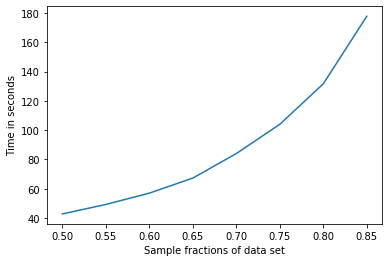

In [33]:
import matplotlib.pyplot as plt
plt.plot([0.85, 0.80, 0.75, 0.70, 0.65, 0.60, 0.55, 0.50], Time_taken)
plt.xlabel("Sample fractions of data set")
plt.ylabel("Time in seconds")
plt.savefig("BX_time", quality = 100)